In [1]:
# All libraries
import jetset
print('tested on jetset',jetset.__version__)
import warnings
warnings.filterwarnings('ignore')
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from jetset.data_loader import Data
from jetset.data_loader import ObsData
from jetset.plot_sedfit import PlotSED
from jetset.jet_model import Jet
from jetset.minimizer import fit_SED,ModelMinimizer
from jetset.model_manager import  FitModel
from jetset.sed_shaper import  SEDShape
from jetset.obs_constrain import ObsConstrain
from jetset.minimizer import fit_SED
from jetset.template_2Dmodel import EBLAbsorptionTemplate
from jetset.mcmc import McmcSampler
from corner import corner
from matplotlib.ticker import MaxNLocator
plt.rcParams.update({'font.size': 14})
plt.rcParams['figure.dpi'] = 200
plt.rcParams["savefig.bbox"] = 'tight'
sed_data = ObsData.load('J163547_data.pkl')

tested on jetset 1.2.2


# $\eta=0.057$

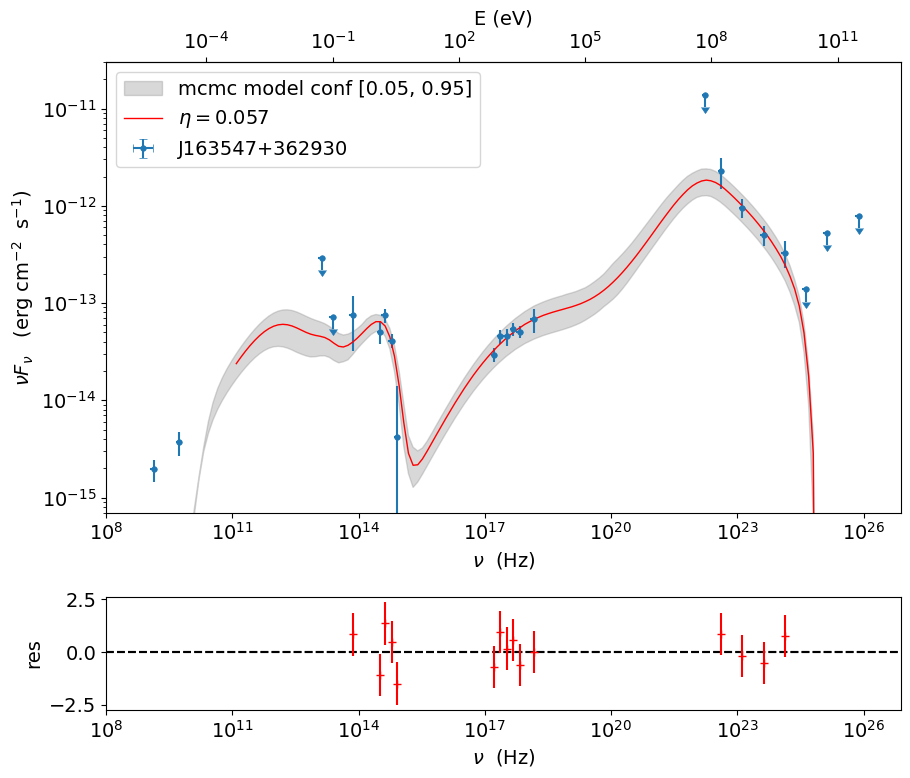

In [3]:
mcmc = McmcSampler.load('mcmc_5_3.pkl')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=100, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)
p.setlim(x_min=1e8,y_max=3.0e-11, y_min=7e-16)
p.save('img_mcmc/mcmc_5.png')

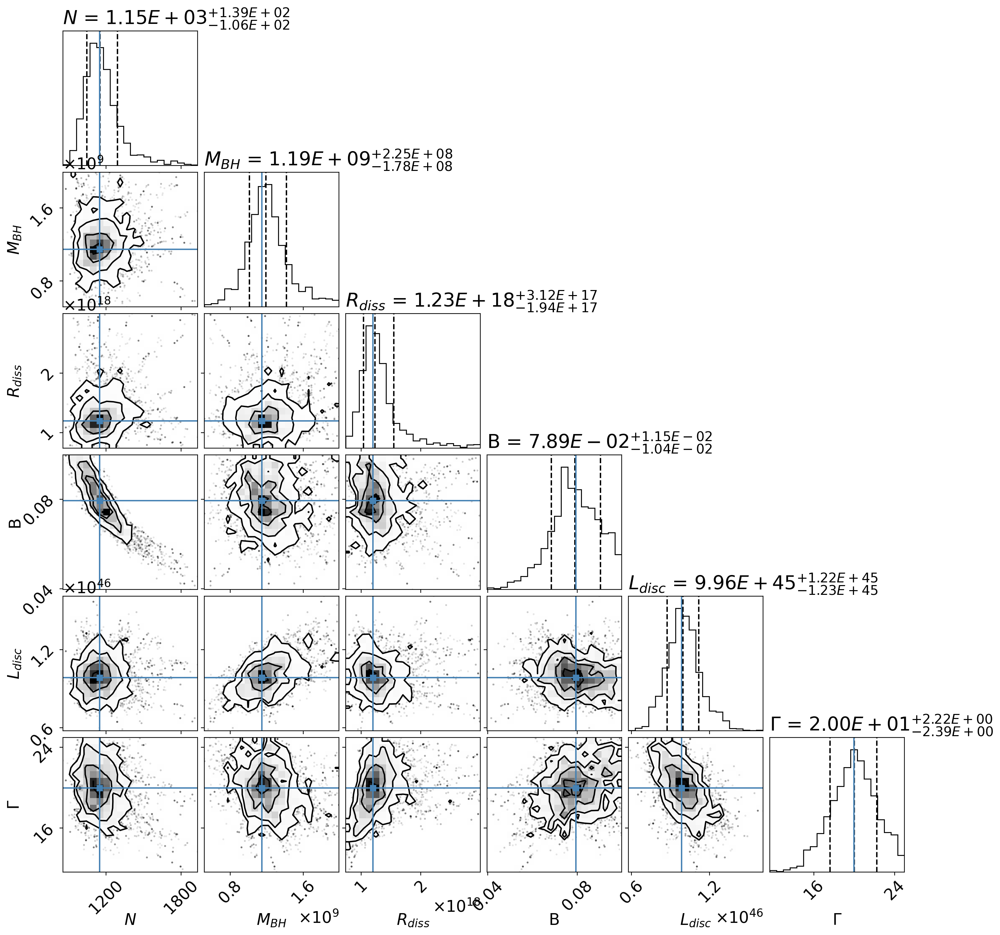

In [5]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams.update({'font.size': 17})
f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(loc='left'),
       use_math_text=True, max_n_ticks=2)


plt.savefig('img_mcmc/corner_5.png', bbox_inches='tight')

In [6]:
n_sample=1000
size = min(len(mcmc.samples), int(n_sample))
ID_mcmc = np.random.randint(len(mcmc.samples), size=size)

energetic_dict_list=[]
for ID,ID_sample in enumerate(ID_mcmc):
    for ID_par, pi in enumerate(mcmc.par_array):
        pi.set(val=mcmc.get_par(ID_par)[0][ID_sample])
    mcmc.model.jet_leptonic.energetic_report(verbose=False)
    energetic_dict_list.append(mcmc.model.jet_leptonic.energetic_dict)

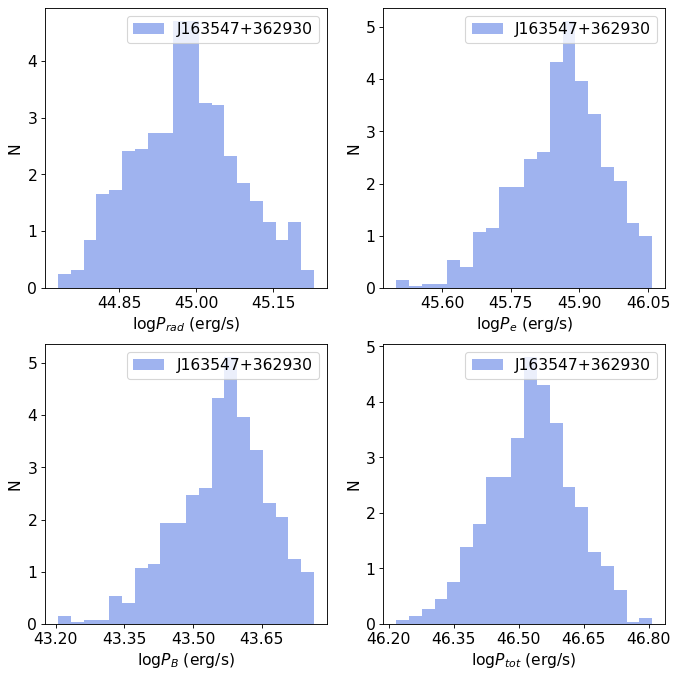

In [7]:
plt.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(2, 2,figsize=(10,10),dpi=80)
p_label=['log$P_{rad}$','log$P_{e}$','log$P_{B}$','log$P_{tot}$']

for ID_ax,k in enumerate(['jet_L_rad','jet_L_e','jet_L_B','jet_L_tot']):
    p=np.zeros(size)
    for ID, d in enumerate(energetic_dict_list):
        p[ID]=d[k]
    
    axs.flatten()[ID_ax].xaxis.set_major_locator(MaxNLocator(5))    
    
    axs.flatten()[ID_ax].hist(np.log10(p),bins=20,density=True,label='J163547+362930',color='royalblue',alpha=0.5)
    axs.flatten()[ID_ax].set_xlabel('%s (erg/s)'%p_label[ID_ax])
    axs.flatten()[ID_ax].legend(loc='best')
    axs.flatten()[ID_ax].set_ylabel('N')
    
plt.savefig('img_mcmc/P_5.png', bbox_inches='tight')

# SSD

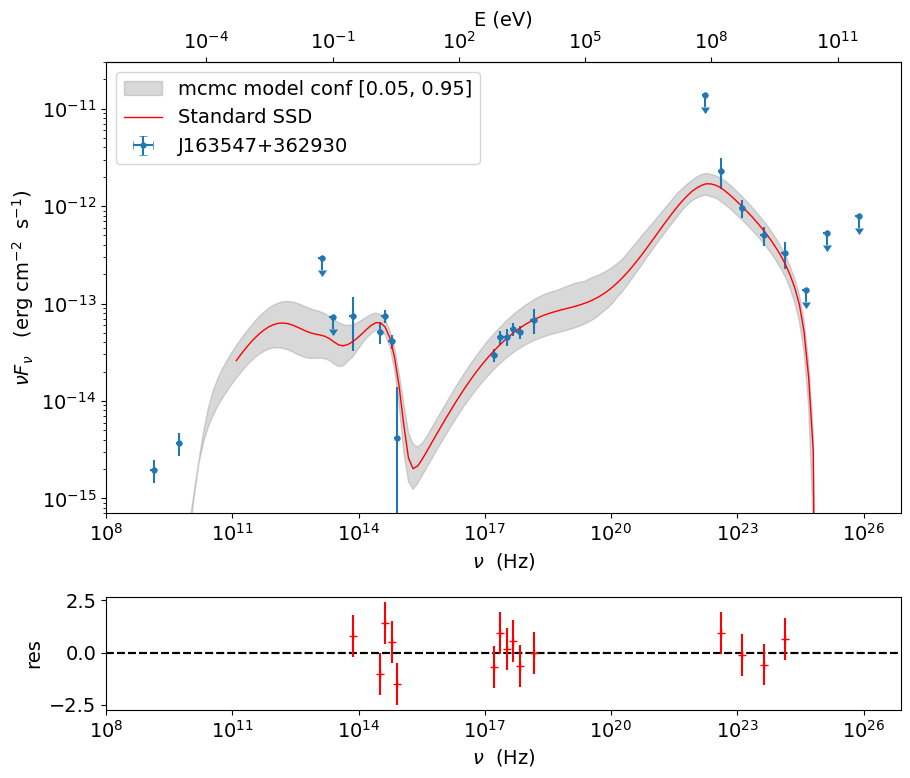

In [15]:
mcmc = McmcSampler.load('mcmc_8_3.pkl')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=100, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)
p.setlim(x_min=1e8,y_max=3.0e-11, y_min=7e-16)
p.save('img_mcmc/mcmc_8.png')

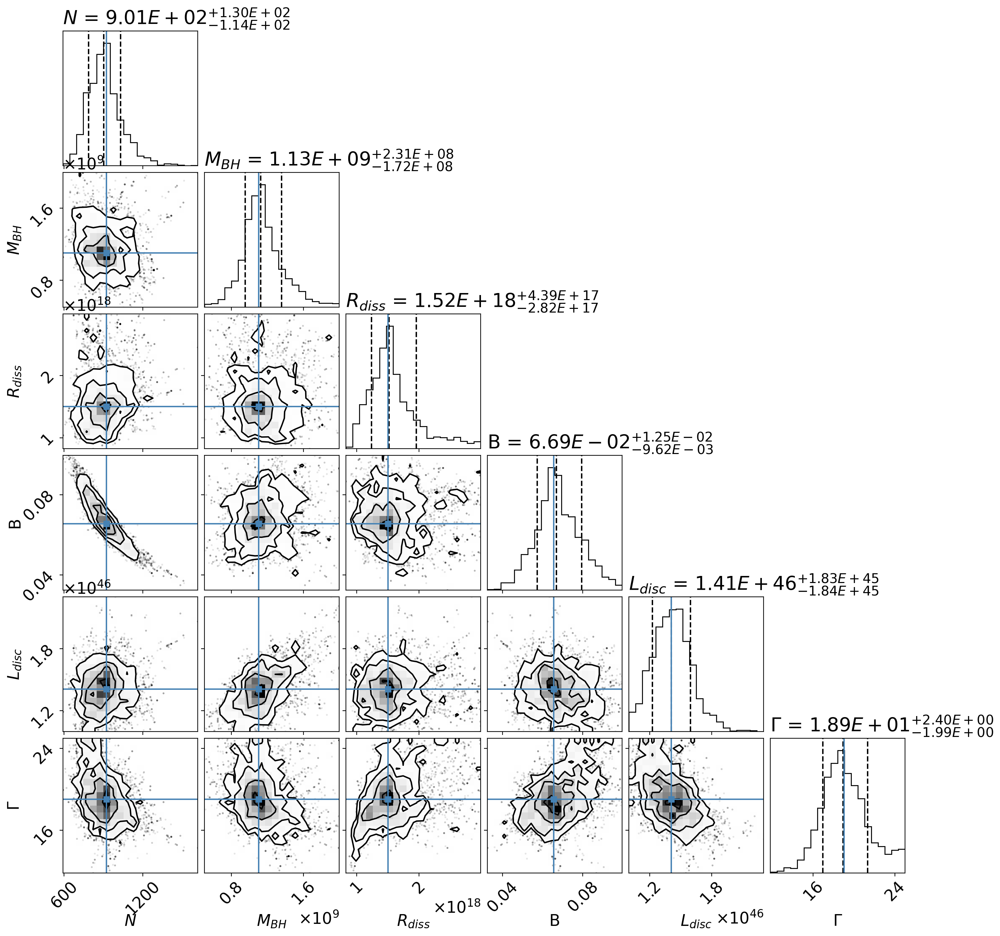

In [16]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams.update({'font.size': 17})
f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(loc='left'),
       use_math_text=True, max_n_ticks=2)


plt.savefig('img_mcmc/corner_8.png', bbox_inches='tight')

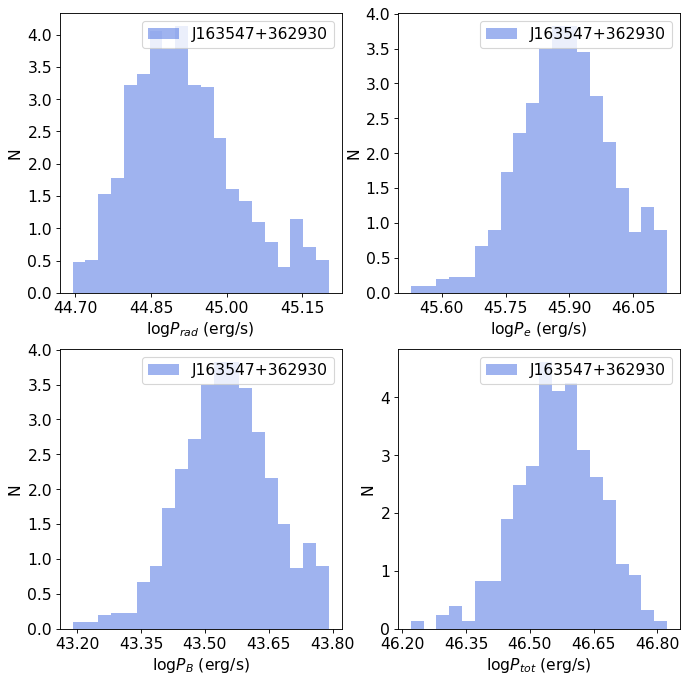

In [17]:
n_sample=1000
size = min(len(mcmc.samples), int(n_sample))
ID_mcmc = np.random.randint(len(mcmc.samples), size=size)

energetic_dict_list=[]
for ID,ID_sample in enumerate(ID_mcmc):
    for ID_par, pi in enumerate(mcmc.par_array):
        pi.set(val=mcmc.get_par(ID_par)[0][ID_sample])
    mcmc.model.jet_leptonic.energetic_report(verbose=False)
    energetic_dict_list.append(mcmc.model.jet_leptonic.energetic_dict)
    
plt.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(2, 2,figsize=(10,10),dpi=80)
p_label=['log$P_{rad}$','log$P_{e}$','log$P_{B}$','log$P_{tot}$']

for ID_ax,k in enumerate(['jet_L_rad','jet_L_e','jet_L_B','jet_L_tot']):
    p=np.zeros(size)
    for ID, d in enumerate(energetic_dict_list):
        p[ID]=d[k]
    
    axs.flatten()[ID_ax].xaxis.set_major_locator(MaxNLocator(5))    
    
    axs.flatten()[ID_ax].hist(np.log10(p),bins=20,density=True,label='J163547+362930',color='royalblue',alpha=0.5)
    axs.flatten()[ID_ax].set_xlabel('%s (erg/s)'%p_label[ID_ax])
    axs.flatten()[ID_ax].legend(loc='best')
    axs.flatten()[ID_ax].set_ylabel('N')
    
plt.savefig('img_mcmc/P_8.png', bbox_inches='tight')

# $\eta=0.100$

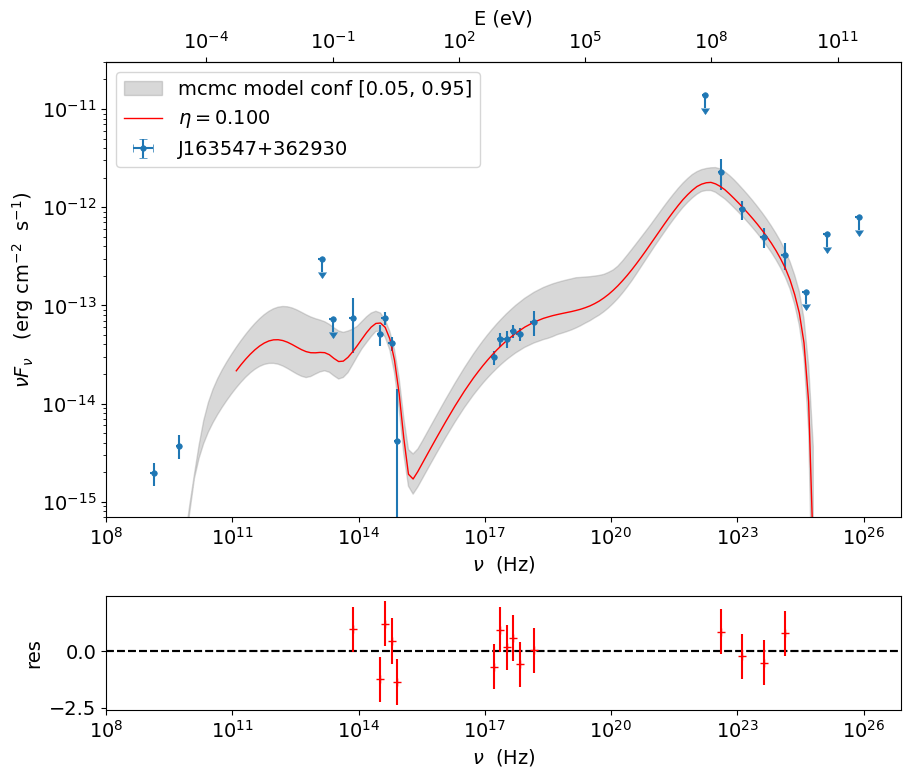

In [18]:
mcmc = McmcSampler.load('mcmc_1_3.pkl')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=100, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)
p.setlim(x_min=1e8,y_max=3.0e-11, y_min=7e-16)
p.save('img_mcmc/mcmc_1.png')

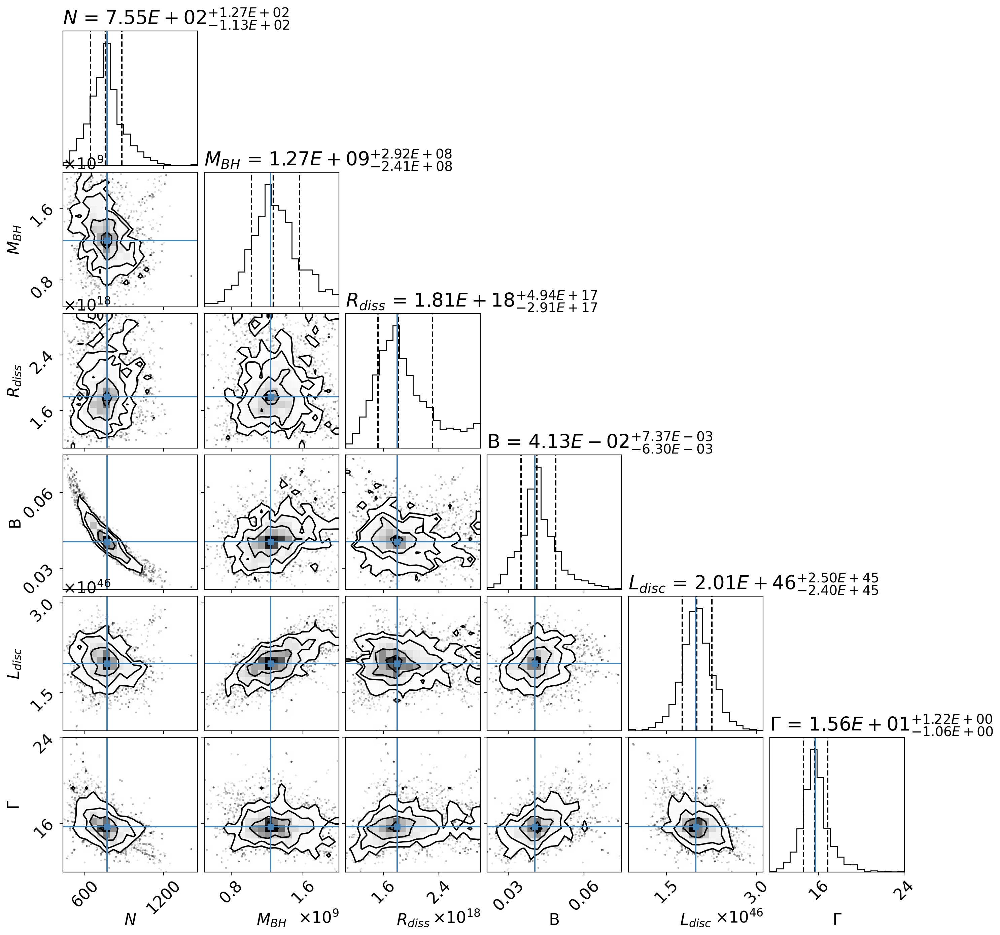

In [19]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams.update({'font.size': 17})
f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(loc='left'),
       use_math_text=True, max_n_ticks=2)


plt.savefig('img_mcmc/corner_1.png', bbox_inches='tight')

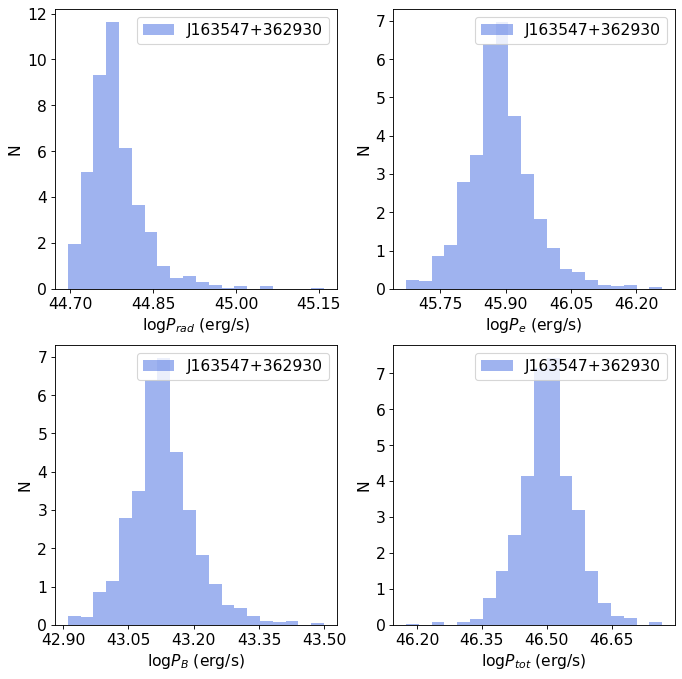

In [20]:
n_sample=1000
size = min(len(mcmc.samples), int(n_sample))
ID_mcmc = np.random.randint(len(mcmc.samples), size=size)

energetic_dict_list=[]
for ID,ID_sample in enumerate(ID_mcmc):
    for ID_par, pi in enumerate(mcmc.par_array):
        pi.set(val=mcmc.get_par(ID_par)[0][ID_sample])
    mcmc.model.jet_leptonic.energetic_report(verbose=False)
    energetic_dict_list.append(mcmc.model.jet_leptonic.energetic_dict)
    
plt.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(2, 2,figsize=(10,10),dpi=80)
p_label=['log$P_{rad}$','log$P_{e}$','log$P_{B}$','log$P_{tot}$']

for ID_ax,k in enumerate(['jet_L_rad','jet_L_e','jet_L_B','jet_L_tot']):
    p=np.zeros(size)
    for ID, d in enumerate(energetic_dict_list):
        p[ID]=d[k]
    
    axs.flatten()[ID_ax].xaxis.set_major_locator(MaxNLocator(5))    
    
    axs.flatten()[ID_ax].hist(np.log10(p),bins=20,density=True,label='J163547+362930',color='royalblue',alpha=0.5)
    axs.flatten()[ID_ax].set_xlabel('%s (erg/s)'%p_label[ID_ax])
    axs.flatten()[ID_ax].legend(loc='best')
    axs.flatten()[ID_ax].set_ylabel('N')
    
plt.savefig('img_mcmc/P_1.png', bbox_inches='tight')

# $\eta=0.150$

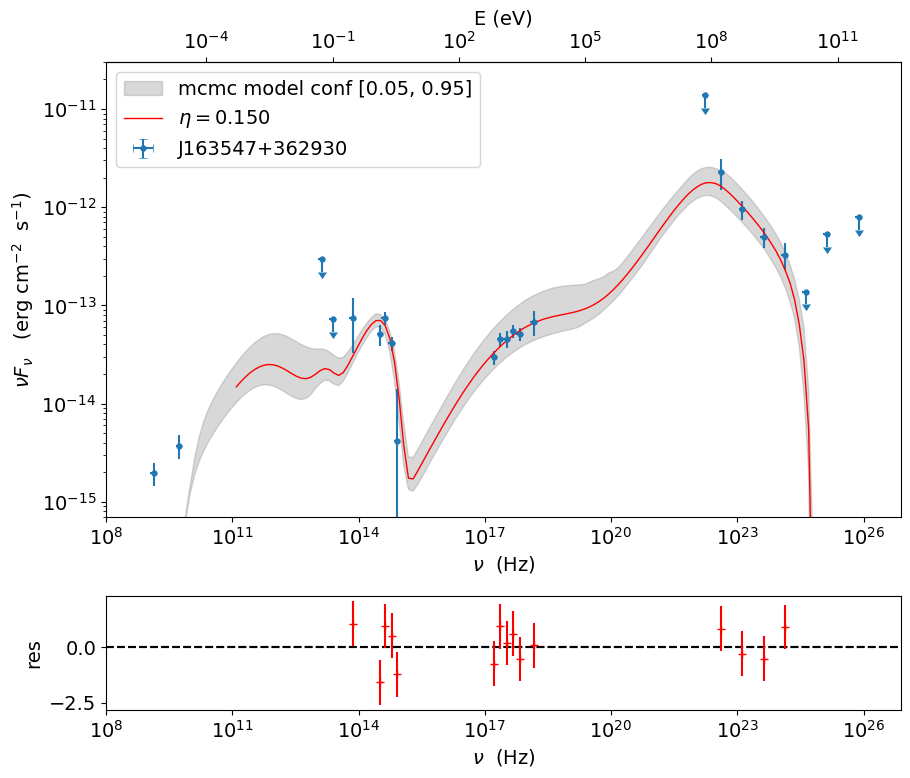

In [21]:
mcmc = McmcSampler.load('mcmc_1_5_3.pkl')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=100, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)
p.setlim(x_min=1e8,y_max=3.0e-11, y_min=7e-16)
p.save('img_mcmc/mcmc_15.png')

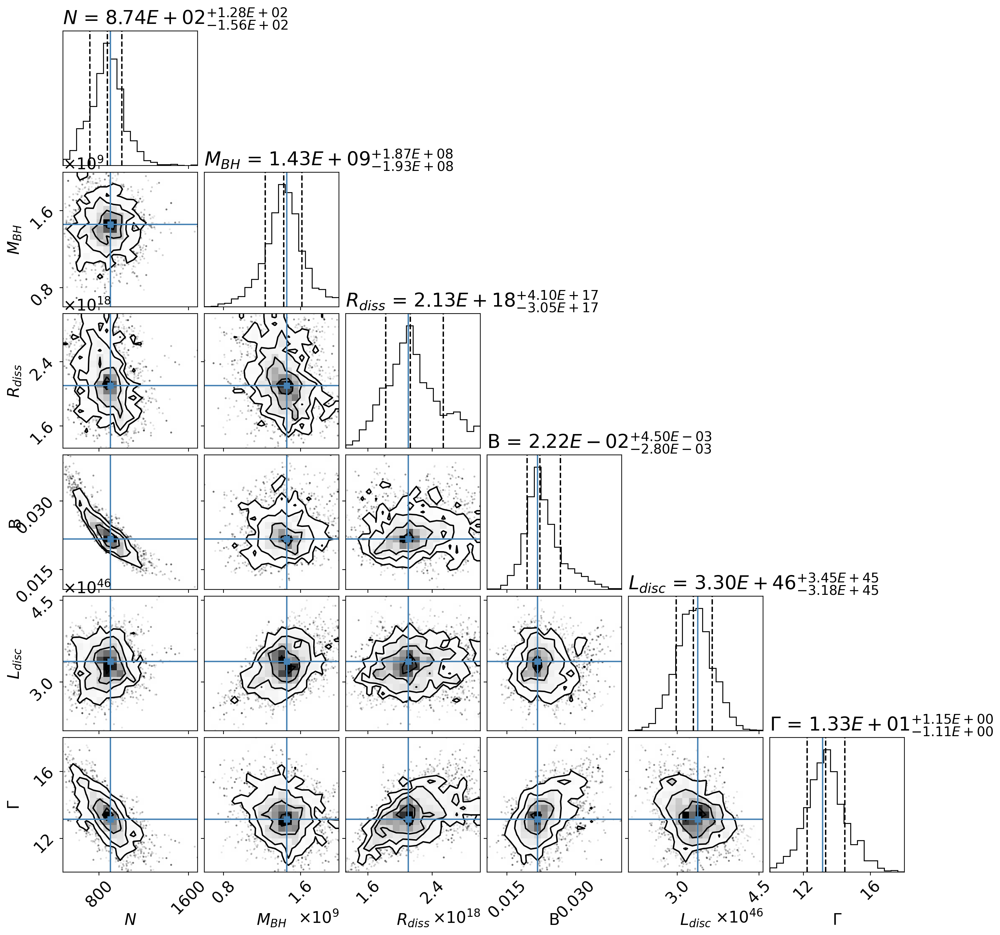

In [22]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams.update({'font.size': 17})
f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(loc='left'),
       use_math_text=True, max_n_ticks=2)


plt.savefig('img_mcmc/corner_15.png', bbox_inches='tight')

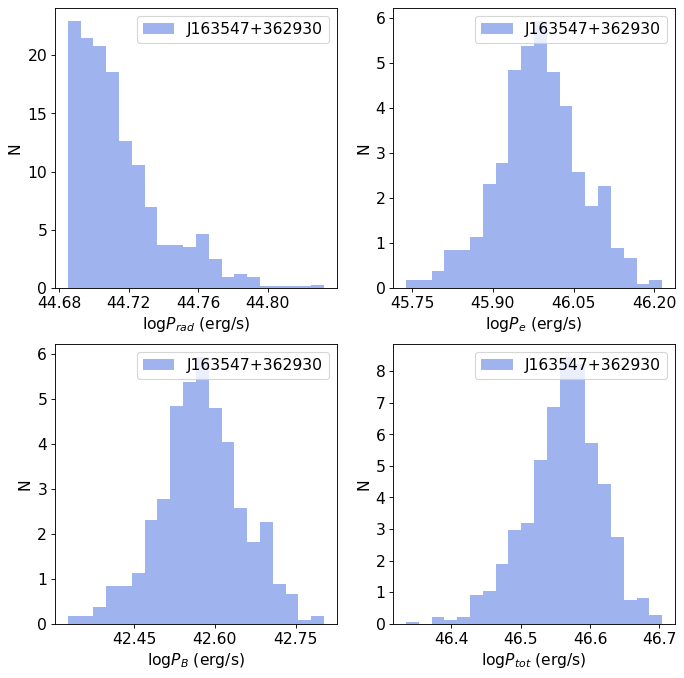

In [23]:
n_sample=1000
size = min(len(mcmc.samples), int(n_sample))
ID_mcmc = np.random.randint(len(mcmc.samples), size=size)

energetic_dict_list=[]
for ID,ID_sample in enumerate(ID_mcmc):
    for ID_par, pi in enumerate(mcmc.par_array):
        pi.set(val=mcmc.get_par(ID_par)[0][ID_sample])
    mcmc.model.jet_leptonic.energetic_report(verbose=False)
    energetic_dict_list.append(mcmc.model.jet_leptonic.energetic_dict)
    
plt.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(2, 2,figsize=(10,10),dpi=80)
p_label=['log$P_{rad}$','log$P_{e}$','log$P_{B}$','log$P_{tot}$']

for ID_ax,k in enumerate(['jet_L_rad','jet_L_e','jet_L_B','jet_L_tot']):
    p=np.zeros(size)
    for ID, d in enumerate(energetic_dict_list):
        p[ID]=d[k]
    
    axs.flatten()[ID_ax].xaxis.set_major_locator(MaxNLocator(5))    
    
    axs.flatten()[ID_ax].hist(np.log10(p),bins=20,density=True,label='J163547+362930',color='royalblue',alpha=0.5)
    axs.flatten()[ID_ax].set_xlabel('%s (erg/s)'%p_label[ID_ax])
    axs.flatten()[ID_ax].legend(loc='best')
    axs.flatten()[ID_ax].set_ylabel('N')
    
plt.savefig('img_mcmc/P_15.png', bbox_inches='tight')

# $\eta=0.200$

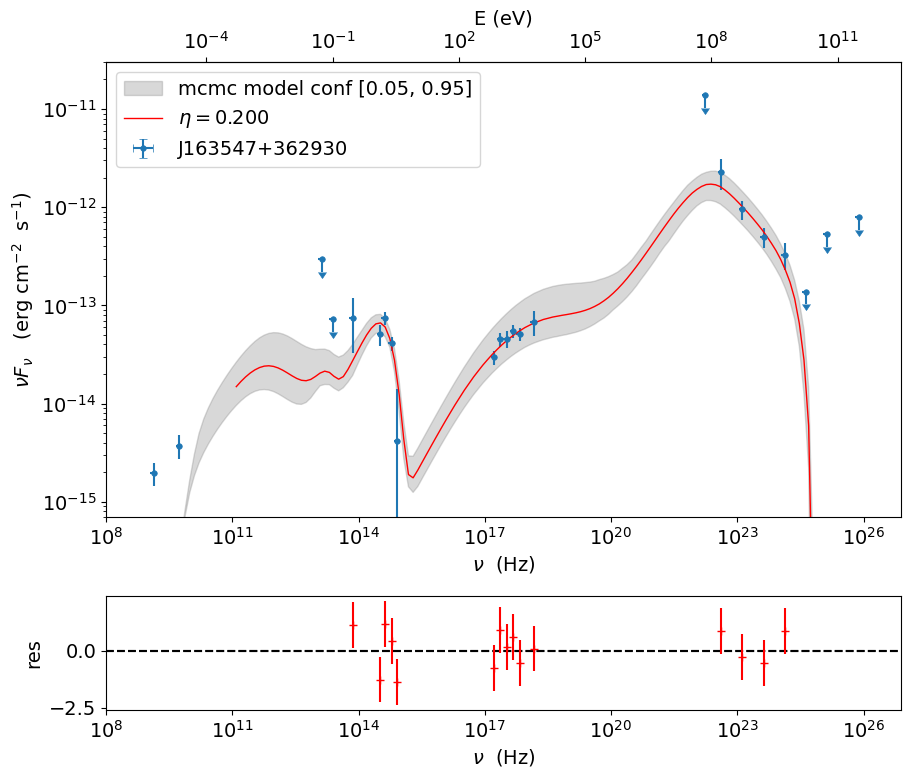

In [24]:
mcmc = McmcSampler.load('mcmc_2_3.pkl')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=100, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)
p.setlim(x_min=1e8,y_max=3.0e-11, y_min=7e-16)
p.save('img_mcmc/mcmc_2.png')

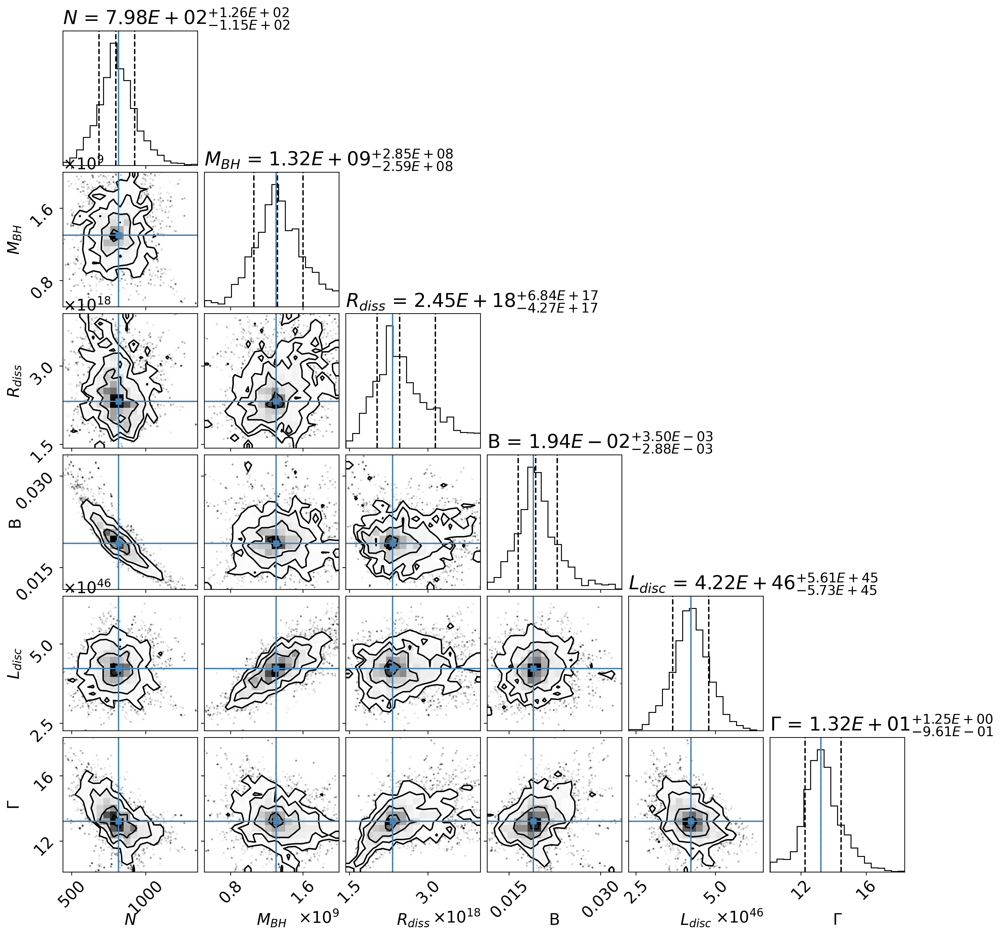

In [25]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams.update({'font.size': 17})
f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(loc='left'),
       use_math_text=True, max_n_ticks=2)


plt.savefig('img_mcmc/corner_2.png', bbox_inches='tight')

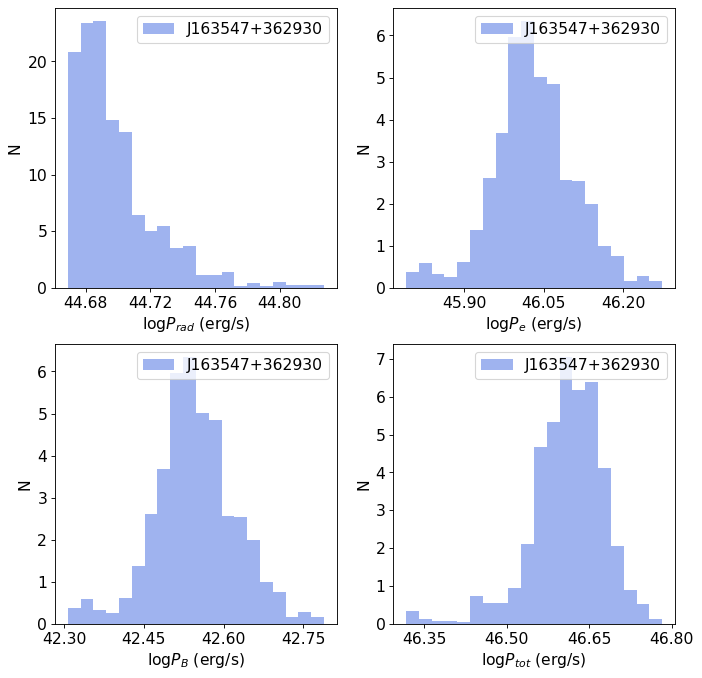

In [26]:
n_sample=1000
size = min(len(mcmc.samples), int(n_sample))
ID_mcmc = np.random.randint(len(mcmc.samples), size=size)

energetic_dict_list=[]
for ID,ID_sample in enumerate(ID_mcmc):
    for ID_par, pi in enumerate(mcmc.par_array):
        pi.set(val=mcmc.get_par(ID_par)[0][ID_sample])
    mcmc.model.jet_leptonic.energetic_report(verbose=False)
    energetic_dict_list.append(mcmc.model.jet_leptonic.energetic_dict)
    
plt.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(2, 2,figsize=(10,10),dpi=80)
p_label=['log$P_{rad}$','log$P_{e}$','log$P_{B}$','log$P_{tot}$']

for ID_ax,k in enumerate(['jet_L_rad','jet_L_e','jet_L_B','jet_L_tot']):
    p=np.zeros(size)
    for ID, d in enumerate(energetic_dict_list):
        p[ID]=d[k]
    
    axs.flatten()[ID_ax].xaxis.set_major_locator(MaxNLocator(5))    
    
    axs.flatten()[ID_ax].hist(np.log10(p),bins=20,density=True,label='J163547+362930',color='royalblue',alpha=0.5)
    axs.flatten()[ID_ax].set_xlabel('%s (erg/s)'%p_label[ID_ax])
    axs.flatten()[ID_ax].legend(loc='best')
    axs.flatten()[ID_ax].set_ylabel('N')
    
plt.savefig('img_mcmc/P_2.png', bbox_inches='tight')

# $\eta=0.300$

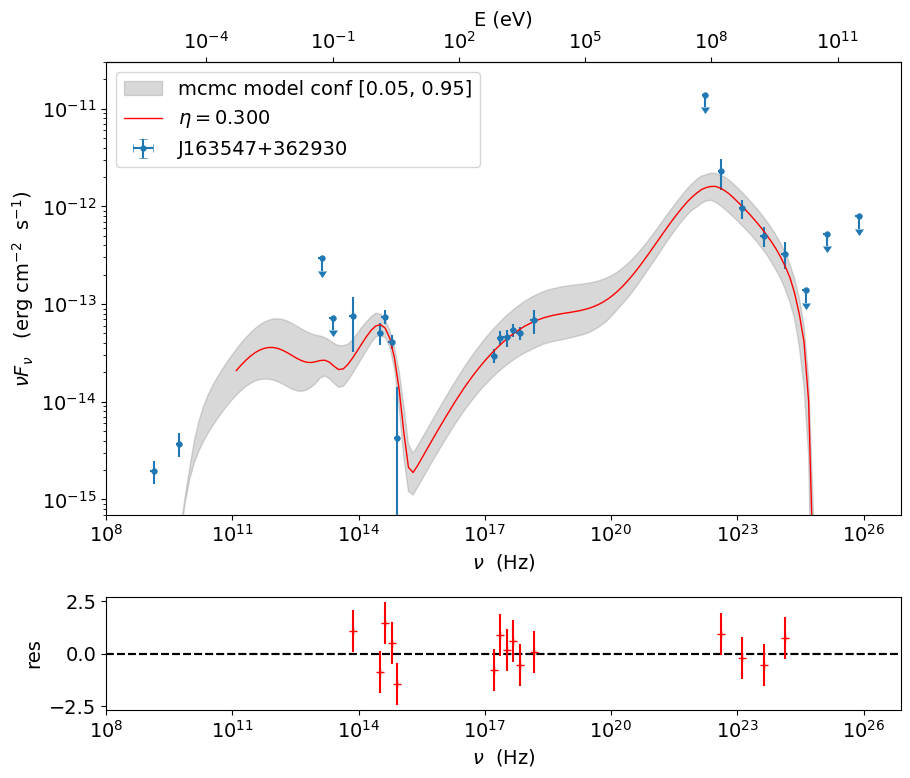

In [27]:
mcmc = McmcSampler.load('mcmc_3_3.pkl')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=100, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)
p.setlim(x_min=1e8,y_max=3.0e-11, y_min=7e-16)
p.save('img_mcmc/mcmc_3.png')

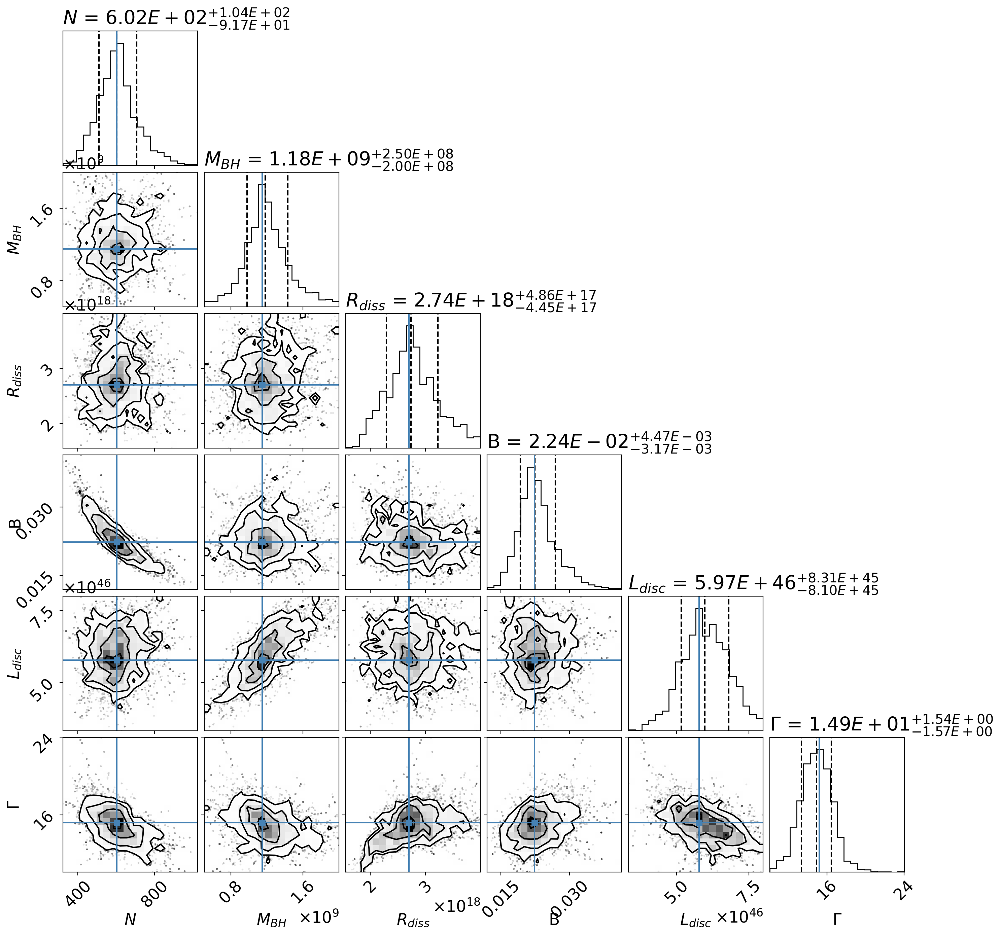

In [28]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams.update({'font.size': 17})
f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(loc='left'),
       use_math_text=True, max_n_ticks=2)


plt.savefig('img_mcmc/corner_3.png', bbox_inches='tight')

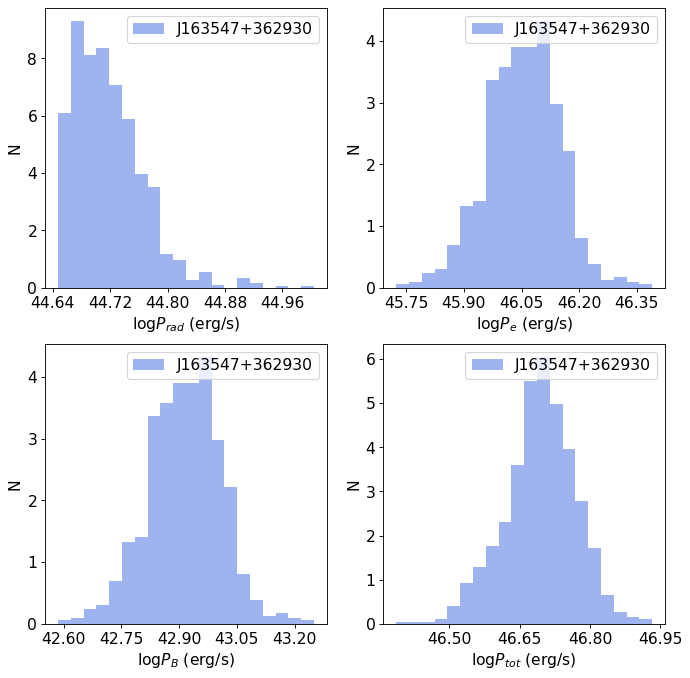

In [29]:
n_sample=1000
size = min(len(mcmc.samples), int(n_sample))
ID_mcmc = np.random.randint(len(mcmc.samples), size=size)

energetic_dict_list=[]
for ID,ID_sample in enumerate(ID_mcmc):
    for ID_par, pi in enumerate(mcmc.par_array):
        pi.set(val=mcmc.get_par(ID_par)[0][ID_sample])
    mcmc.model.jet_leptonic.energetic_report(verbose=False)
    energetic_dict_list.append(mcmc.model.jet_leptonic.energetic_dict)
    
plt.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(2, 2,figsize=(10,10),dpi=80)
p_label=['log$P_{rad}$','log$P_{e}$','log$P_{B}$','log$P_{tot}$']

for ID_ax,k in enumerate(['jet_L_rad','jet_L_e','jet_L_B','jet_L_tot']):
    p=np.zeros(size)
    for ID, d in enumerate(energetic_dict_list):
        p[ID]=d[k]
    
    axs.flatten()[ID_ax].xaxis.set_major_locator(MaxNLocator(5))    
    
    axs.flatten()[ID_ax].hist(np.log10(p),bins=20,density=True,label='J163547+362930',color='royalblue',alpha=0.5)
    axs.flatten()[ID_ax].set_xlabel('%s (erg/s)'%p_label[ID_ax])
    axs.flatten()[ID_ax].legend(loc='best')
    axs.flatten()[ID_ax].set_ylabel('N')
    
plt.savefig('img_mcmc/P_3.png', bbox_inches='tight')